In [29]:
import numpy as np
import pandas as pd
import os
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds
from pathlib import Path
import matplotlib.pyplot as plt
import cv2
from collections import Counter

In [3]:
print(tf.__version__)

2.14.0


**Tập dữ liệu COCO2017 cho phát hiện khuôn mặt và phát hiện người**

loading annotations into memory...
Done (t=38.50s)
creating index...
index created!
Person category ID: [1]
Số ảnh chứa người: 64115


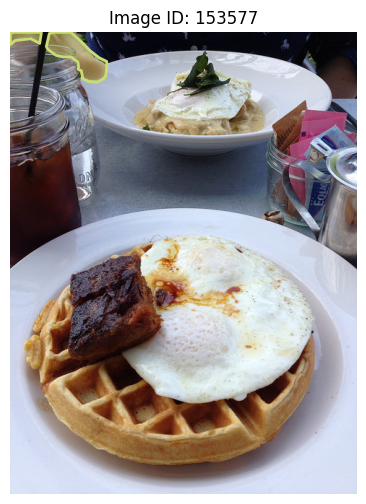

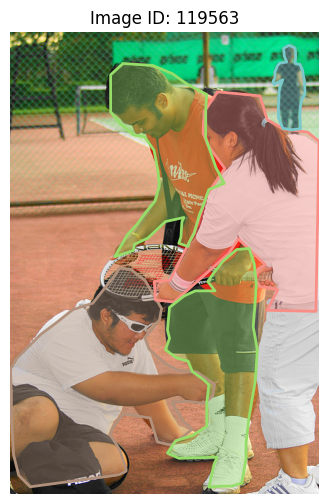

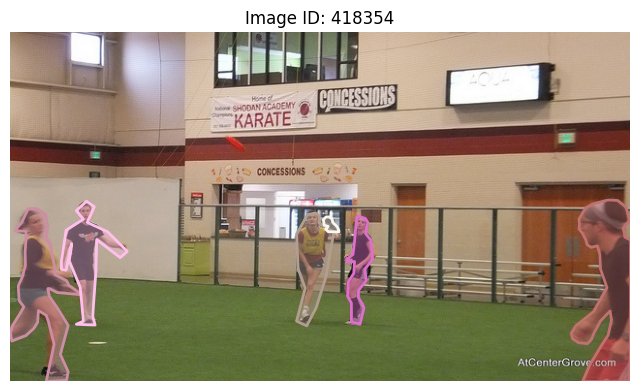

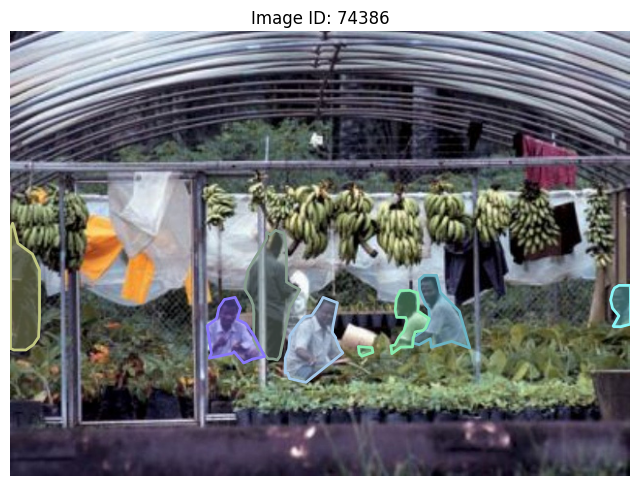

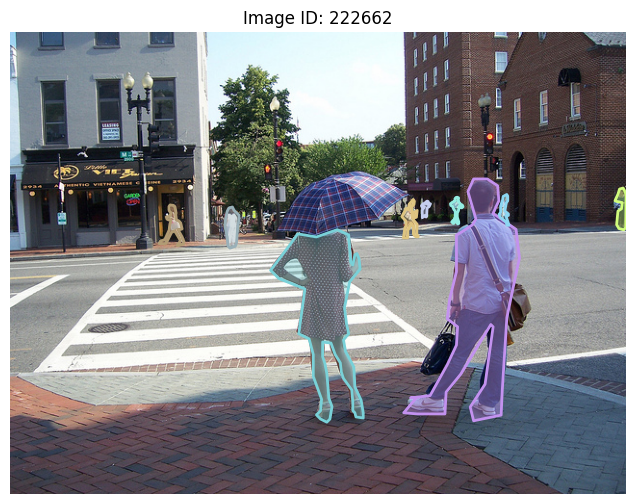

In [53]:
from pycocotools.coco import COCO
import random

# Đường dẫn
data_dir = r"D:\Dataset"
img_dir = os.path.join(data_dir, "train2017")
ann_file = os.path.join(data_dir, "annotations", "instances_train2017.json")

# Load annotation
coco = COCO(ann_file)

# ID của class 'person'
cat_ids = coco.getCatIds(catNms=['person'])  # [1]
print("Person category ID:", cat_ids)

# Lấy danh sách ảnh chứa class 'person'
img_ids = coco.getImgIds(catIds=cat_ids)
print("Số ảnh chứa người:", len(img_ids))

# Lấy ngẫu nhiên 5 ảnh để trực quan hóa
random_ids = random.sample(img_ids, 5)

for img_id in random_ids:
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    # Đọc ảnh
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Lấy annotation (bounding box) liên quan đến ảnh này
    ann_ids = coco.getAnnIds(imgIds=img_id, catIds=cat_ids, iscrowd=False)
    anns = coco.loadAnns(ann_ids)

    # Vẽ ảnh + bbox
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    coco.showAnns(anns)
    plt.axis('off')
    plt.title(f"Image ID: {img_id}")
    plt.show()


In [ ]:
print(f"Kích thước ảnh: {img.shape}") 


Kích thước ảnh: (480, 640, 3)


**Tập dữ liệu Fer2013 Dataset cho nhận diện cảm xúc**


In [ ]:
data_dir = pathlib.Path(r"\khai\fer2013")
train_dir = data_dir / 'train'
test_dir = data_dir / 'test'
train_images = list(train_dir.glob('*/*.jpg'))
test_images = list(test_dir.glob('*/*.jpg'))
total_images = len(train_images) + len(test_images)

print(f"Kích thước của ảnh: {cv2.imread(str((train_dir / emotion_classes[0]).glob('*.jpg').__next__())).shape}")
print(f"Số ảnh trong train: {len(train_images)}")
print(f"Số ảnh trong test: {len(test_images)}")
print(f"Tổng số ảnh: {total_images}")


Kích thước của ảnh: (48, 48, 3)
Số ảnh trong train: 28709
Số ảnh trong test: 7178
Tổng số ảnh: 35887


In [ ]:
#Liệt kê lớp(emotions)
emotion_classes = sorted([item.name for item in train_dir.glob('*') if item.is_dir()])
print(f"Số lớp cảm xúc: {len(emotion_classes)}")
print("Danh sách lớp:", emotion_classes)

Số lớp cảm xúc: 7
Danh sách lớp: ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']


In [23]:
# Đếm số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp:")
for emotion in emotion_classes:
    emotion_path = train_dir / emotion
    image_count = len(list(emotion_path.glob('*.jpg')))
    print(f"{emotion}: {image_count} ảnh")


Số lượng ảnh trong mỗi lớp:
angry: 3995 ảnh
disgust: 436 ảnh
fear: 4097 ảnh
happy: 7215 ảnh
neutral: 4965 ảnh
sad: 4830 ảnh
surprise: 3171 ảnh


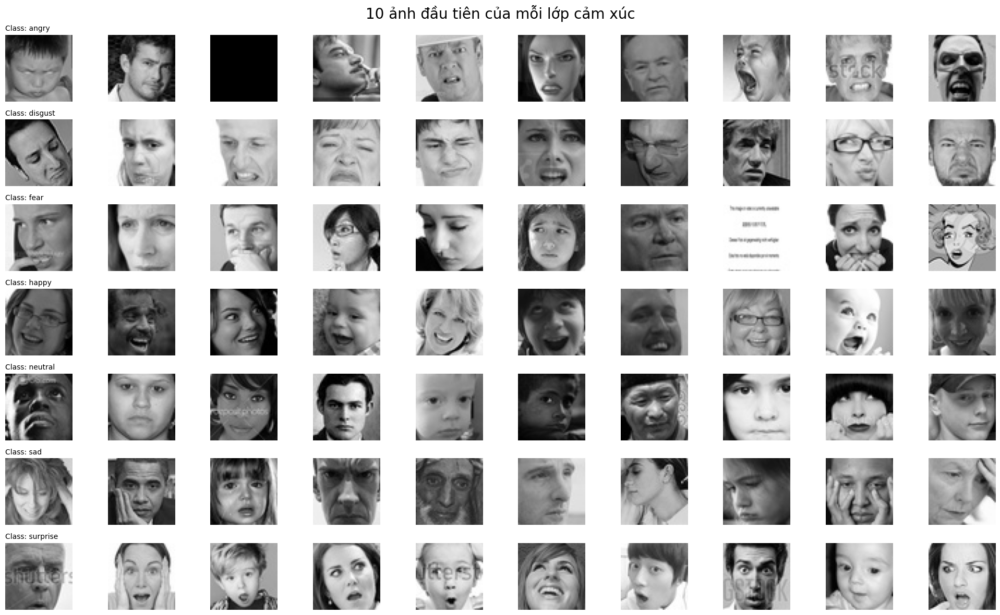

In [16]:
# Hiển thị 10 ảnh mỗi lớp
plt.figure(figsize=(20, 12))
for i, emotion in enumerate(emotion_classes):
    emotion_path = train_dir / emotion
    image_paths = list(emotion_path.glob('*.jpg'))[:10]
    for j, img_path in enumerate(image_paths):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = plt.subplot(len(emotion_classes), 10, i*10 + j + 1)
        plt.imshow(img)
        plt.axis('off')
        if j == 0:
            ax.set_title(f"Class: {emotion}", fontsize=10, loc='left')
plt.suptitle("10 ảnh đầu tiên của mỗi lớp cảm xúc", fontsize=20)
plt.tight_layout()
plt.show()


**Tập dữ liệu Human Action Recognition (HAR) cho nhận diện hành vi**

In [ ]:
data_dir = Path("\khai\har\Human Action Recognition")
train_dir = data_dir / "train"
test_dir = data_dir / "test"

train_df = pd.read_csv(data_dir / "Training_set.csv")
test_df = pd.read_csv(data_dir / "Testing_set.csv")


first_image_path = train_dir / train_df.iloc[0, 0]
img = cv2.imread(str(first_image_path))
img_shape = img.shape  # (height, width, channels)

num_train = len(train_df)
num_test = len(test_df)
total_images = num_train + num_test

print(f"Kích thước ảnh: {img_shape}")
print(f"Số ảnh trong tập train: {num_train}")
print(f"Số ảnh trong tập test: {num_test}")
print(f"Tổng số ảnh: {total_images}")

Kích thước ảnh: (160, 240, 3)
Số ảnh trong tập train: 12600
Số ảnh trong tập test: 5400
Tổng số ảnh: 18000


In [50]:
#lớp hành vi và tên các lớp
all_labels = pd.concat([train_df['label']])
class_names = sorted(all_labels.unique())
num_classes = len(class_names)
print(f"Số lớp hành vi: {num_classes}")
print(f"Các lớp: {class_names}")

Số lớp hành vi: 15
Các lớp: ['calling', 'clapping', 'cycling', 'dancing', 'drinking', 'eating', 'fighting', 'hugging', 'laughing', 'listening_to_music', 'running', 'sitting', 'sleeping', 'texting', 'using_laptop']


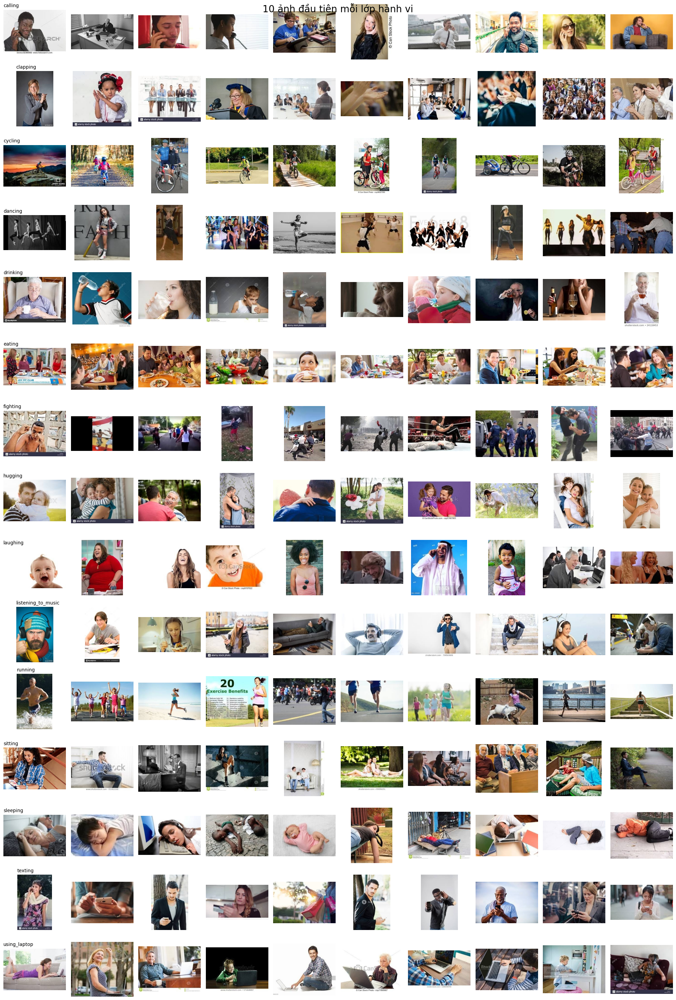

In [51]:
# 7. Hiển thị 10 ảnh mỗi lớp trong tập train
plt.figure(figsize=(20, num_classes * 2))
for i, cls in enumerate(class_names):
    sample_images = train_df[train_df['label'] == cls].iloc[:10]
    for j, row in enumerate(sample_images.itertuples()):
        img_path = train_dir / getattr(row, "filename")
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = plt.subplot(num_classes, 10, i * 10 + j + 1)
        plt.imshow(img)
        plt.axis('off')
        if j == 0:
            ax.set_title(f"{cls}", fontsize=10, loc='left')
plt.suptitle("10 ảnh đầu tiên mỗi lớp hành vi", fontsize=20)
plt.tight_layout()
plt.show()